## Trajectory Visualizer: PIE Dataset

### Importing Libraries

In [22]:
import sys
import yaml
import munch
import pathlib as pl
import os
original_dir = pl.Path.cwd()
parent_dir = pl.Path.cwd().parent
os.chdir(parent_dir)
from utils.misc import set_seed, set_device, cxcy_to_xy, unnormalize_coords 
from models.astra_model import ASTRA_model
from models.keypoint_model import UNETEmbeddingExtractor
from data.PIE_origin import PIE
os.chdir(original_dir)
from torch import nn
import torch
import torch.utils.data as data
from pprint import pprint
import albumentations as A
import cv2
from icecream import ic 
from albumentations.pytorch import ToTensorV2
import matplotlib.pyplot as plt
import numpy as np

### Select Best Config & Best Models Path

In [11]:
best_config_path = '../configs/pie.yaml'
astra_model_path = '../pretrained_astra_weights/pie_best_model.pth'
unet_model_path = '../pretrained_unet_weights/pie_unet_model_best.pt'

### Dataset & Dataloader

In [13]:
class PIEDataLayer(data.Dataset):
    def __init__(self, cfg, split, transform = None):
        self.split = split
        self.root = '../datasets/PIE'
        self.cfg = cfg
        # NOTE: add downsample function
        self.downsample_step = int(30/self.cfg.DATA.FPS)
        traj_data_opts = {'fstride': 1,
                 'sample_type': 'all',
                 'height_rng': [0, float('inf')],
                 'squarify_ratio': 0,
                 'data_split_type': 'default',  # kfold, random, default
                 'seq_type': 'trajectory',
                 'min_track_size': 61,
                 'random_params': {'ratios': None,
                                 'val_data': True,
                                 'regen_data': True},
                 'kfold_params': {'num_folds': 5, 'fold': 1}}

        traj_model_opts = {'normalize_bbox': True,
                       'track_overlap': 0.5,
                       'observe_length': int(self.cfg.PREDICTION.OBS_TIME * self.cfg.DATA.FREQUENCY),
                       'predict_length': int(self.cfg.PREDICTION.PRED_TIME * self.cfg.DATA.FREQUENCY),
                       'enc_input_type': ['bbox'],
                       'dec_input_type': [], 
                       'prediction_type': ['bbox']
                       }
        imdb = PIE(data_path=self.root)
        
        traj_model_opts['enc_input_type'].extend(['obd_speed', 'heading_angle'])
        traj_model_opts['prediction_type'].extend(['obd_speed', 'heading_angle'])
        beh_seq = imdb.generate_data_trajectory_sequence(self.split, **traj_data_opts)
        self.data = self.get_traj_data(beh_seq, **traj_model_opts)
        self.transform = transform

    def __getitem__(self, index):
        obs_bbox = torch.FloatTensor(self.data['obs_bbox'][index])
        pred_bbox = torch.FloatTensor(self.data['pred_bbox'][index])
        cur_image_file = self.data['obs_image'][index]
        angle = self.data['heading_angle'][index]
        velocity = self.data['velocity'][index]
        past_images = []
        if self.cfg.MODEL.USE_PRETRAINED_UNET:
            for img_path in cur_image_file:
                img = cv2.imread(img_path)
                img = img[...,::-1]
                pixel_coord = [(0,0)]
                if self.transform:
                    transformed = self.transform(image=img, keypoints=pixel_coord)
                    img = transformed['image']
                img = img.unsqueeze(0).to(torch.float32)
                past_images.append(img)
            past_images = torch.cat(past_images)
        cur_image_file = cur_image_file[-1]
        ret = {'input_x':obs_bbox,
               'target_y':pred_bbox, 
               'cur_image_file':cur_image_file,
               'heading_angle': angle,
               'velocity': velocity,
               'past_images': past_images}
        
        ret['timestep'] = int(cur_image_file.split('/')[-1].split('.')[0])
        
        return ret

    def __len__(self):
        return len(self.data[list(self.data.keys())[0]])

    def get_traj_tracks(self, dataset, data_types, observe_length, predict_length, overlap, normalize):
        #  Calculates the overlap in terms of number of frames
        seq_length = observe_length + predict_length
        overlap_stride = observe_length if overlap == 0 else \
            int((1 - overlap) * observe_length)
        overlap_stride = 1 if overlap_stride < 1 else overlap_stride

        #  Check the validity of keys selected by user as data type
        d = {}
        for dt in data_types:
            try:
                d[dt] = dataset[dt]
            except:# KeyError:
                raise KeyError('Wrong data type is selected %s' % dt)
        
        d['image'] = dataset['image']
        d['pid'] = dataset['pid']
        d['resolution'] = dataset['resolution']
        d['flow'] = []
        num_trks = len(d['image'])
        #  Sample tracks from sequneces
        for k in d.keys():
            tracks = []
            for track in d[k]:
                for i in range(0, len(track) - seq_length + 1, overlap_stride):
                    tracks.append(track[i:i + seq_length])
            d[k] = tracks
        #  Normalize tracks using FOL paper method, 
        d['bbox'] = self.convert_normalize_bboxes(d['bbox'], d['resolution'], 
                                                  self.cfg.DATA.NORMALIZE, self.cfg.DATA.BBOX_TYPE)
        return d

    def convert_normalize_bboxes(self, all_bboxes, all_resolutions, normalize, bbox_type):
        for i in range(len(all_bboxes)):
            if len(all_bboxes[i]) == 0:
                continue
            bbox = np.array(all_bboxes[i])
            # NOTE ltrb to cxcywh
            if bbox_type == 'cxcywh':
                bbox[..., [2, 3]] = bbox[..., [2, 3]] - bbox[..., [0, 1]]
                bbox[..., [0, 1]] += bbox[..., [2, 3]]/2
            # NOTE Normalize bbox
            if normalize == 'zero-one':
                # W, H  = all_resolutions[i][0]
                _min = np.array(self.cfg.DATA.MIN_BBOX)[None, :]
                _max = np.array(self.cfg.DATA.MAX_BBOX)[None, :]
                bbox = (bbox - _min) / (_max - _min)
            elif normalize == 'plus-minus-one':
                # W, H  = all_resolutions[i][0]
                _min = np.array(self.cfg.DATA.MIN_BBOX)[None, :]
                _max = np.array(self.cfg.DATA.MAX_BBOX)[None, :]
                bbox = (2 * (bbox - _min) / (_max - _min)) - 1
            elif normalize == 'none':
                pass
            else:
                raise ValueError(normalize)
            all_bboxes[i] = bbox
        return all_bboxes

    def get_data_helper(self, data, data_type):
        if not data_type:
            return []
        d = []
        for dt in data_type:
            if dt == 'image':
                continue
            d.append(np.array(data[dt]))
            
        #  Concatenate different data points into a single representation
        if len(d) > 1:
            return np.concatenate(d, axis=2)
        elif len(d) == 1:
            return d[0]
        else:
            return d

    def get_traj_data(self, data, **model_opts):        
        opts = {
            'normalize_bbox': True,
            'track_overlap': 0.5,
            'observe_length': int(self.cfg.PREDICTION.OBS_TIME * self.cfg.DATA.FREQUENCY),
            'predict_length': int(self.cfg.PREDICTION.PRED_TIME * self.cfg.DATA.FREQUENCY),
            'enc_input_type': ['bbox'],
            'dec_input_type': [],
            'prediction_type': ['bbox']
        }
        for key, value in model_opts.items():
            assert key in opts.keys(), 'wrong data parameter %s' % key
            opts[key] = value

        observe_length = opts['observe_length']
        predict_length = opts['predict_length']
        data_types = set(opts['enc_input_type'] + opts['dec_input_type'] + opts['prediction_type'])
        data_tracks = self.get_traj_tracks(data, data_types, observe_length,
                                      opts['predict_length'], opts['track_overlap'],
                                      opts['normalize_bbox'])
        obs_slices = {}
        pred_slices = {}
        #  Generate observation/prediction sequences from the tracks
        for k in data_tracks.keys():
            obs_slices[k] = []
            pred_slices[k] = []
            # NOTE: Add downsample function
            down = self.downsample_step
            obs_slices[k].extend([d[down-1:observe_length:down] for d in data_tracks[k]])
            if k == 'bbox':
                start = observe_length
                end = observe_length + predict_length
                target_list = [d[start:end:down] for d in data_tracks[k]]
                pred_slices[k].extend(target_list)
        ret =  {'obs_image': obs_slices['image'],
                'obs_pid': obs_slices['pid'],
                'obs_resolution': obs_slices['resolution'],
                'pred_image': pred_slices['image'],
                'pred_pid': pred_slices['pid'],
                'pred_resolution': pred_slices['resolution'],
                'obs_bbox': np.array(obs_slices['bbox']), #enc_input,
                'pred_bbox': np.array(pred_slices['bbox']), #pred_target,
                'heading_angle': obs_slices['heading_angle'],
                'velocity': obs_slices['obd_speed']
                }
        
        return ret

    def get_path(self,
                 file_name='',
                 save_folder='models',
                 dataset='pie',
                 model_type='trajectory',
                 save_root_folder='data/'):
        save_path = os.path.join(save_root_folder, dataset, model_type, save_folder)
        if not os.path.exists(save_path):
            os.makedirs(save_path)
        return os.path.join(save_path, file_name), save_path

    def get_target(self, session, start, end, observe_length, predict_length):
        target = np.zeros((observe_length, predict_length, session.shape[-1]))
        for i, target_start in enumerate(range(start, end)):
            '''the target of time t is the change of bbox/ego motion at times [t+1,...,t+5}'''
            # i, target_start = (0,0) (1,1) (2,2) ......
            target_start = target_start + 1
            try:
                target[i,:,:] = np.asarray(session[target_start:target_start+predict_length,:] - 
                                           session[target_start-1:target_start,:])
            except:
                print("segment start: ", start)
                print("sample start: ", target_start)
                print("segment end: ", end)
                print(session.shape)
                raise ValueError()
        return target

In [14]:
args = dict()
args["config_file"] = best_config_path
cfg = yaml.safe_load(open(args["config_file"], "r"))
cfg = munch.munchify(cfg)
device, device_list = set_device(cfg.TRAIN.DEVICE, cfg.TRAIN.BATCH_SIZE)
cfg.update(device = device)
cfg.update(device_list = device_list)
set_seed(cfg.TRAIN.SEED)
cfg.TRAIN.BATCH_SIZE = 8
train_dataset = PIEDataLayer(cfg, cfg.MODE)
test_dataset = PIEDataLayer(cfg, 'test')
print(cfg.TRAIN.BATCH_SIZE)
device, device_list = cfg.device, cfg.device_list
num_device = len(device_list)

batch_size = cfg.TRAIN.BATCH_SIZE
num_epoch = cfg.TRAIN.NUM_EPOCH
workers_single = cfg.TRAIN.NUM_WORKERS

train_loader = data.DataLoader(
        dataset=train_dataset,
        batch_size=cfg.TRAIN.BATCH_SIZE,
        shuffle=True,
        num_workers=workers_single * num_device)

test_loader = data.DataLoader(
    dataset=test_dataset,
    batch_size=cfg.TRAIN.BATCH_SIZE,
    shuffle=True,
    num_workers=workers_single * num_device)

---------------------------------------------------------
Generating trajectory sequence data
fstride: 1
sample_type: all
height_rng: [0, inf]
squarify_ratio: 0
data_split_type: default
seq_type: trajectory
min_track_size: 61
random_params: {'ratios': None, 'val_data': True, 'regen_data': True}
kfold_params: {'num_folds': 5, 'fold': 1}
---------------------------------------------------------
Generating database for pie
pie annotations loaded from /home/cminds/CMInDS/GitHub/astra/graph_t/datasets/PIE/data_cache/pie_database.pkl
---------------------------------------------------------
Generating trajectory data
Subset: train
Number of pedestrians: 880 
Total number of used pedestrians: 866 
---------------------------------------------------------
Generating trajectory sequence data
fstride: 1
sample_type: all
height_rng: [0, inf]
squarify_ratio: 0
data_split_type: default
seq_type: trajectory
min_track_size: 61
random_params: {'ratios': None, 'val_data': True, 'regen_data': True}
kfol

### Loading Best Model

In [16]:
model = ASTRA_model(cfg)
gpu_num = device
if num_device > 1:
    model = nn.DataParallel(model, device_ids = device_list)
    gpu_num = f'cuda:{model.device_ids[0]}'
model = model.to(device)
model.load_state_dict(torch.load(f'{astra_model_path}'))
print(f'Loaded ASTRA model from {astra_model_path}')

Loaded ASTRA model from ../pretrained_astra_weights/pie_best_model.pth


In [17]:
if cfg.MODEL.USE_PRETRAINED_UNET:
    embedding_extractor = UNETEmbeddingExtractor(cfg)
    cfg.UNET_MODE = 'testing'
    embedding_extractor.load_state_dict(torch.load(unet_model_path))
    print(f'Loaded UNET model from {unet_model_path}')
    embedding_extractor.unet.decoder = nn.Identity()
    embedding_extractor.feature_extractor = nn.Identity()
    embedding_extractor.seg_head = nn.Identity()
    embedding_extractor.branch1 = nn.Identity()
    embedding_extractor.branch2 = nn.Identity()
    embedding_extractor.regression_head = nn.Identity()
    for param in embedding_extractor.parameters():
        param.requires_grad = False
    embedding_extractor.eval()
    embedding_extractor = embedding_extractor.to(device)
else:
    embedding_extractor = None

### Visualizing Predictions

In [23]:
def visualize_path(loader, batch_num = 0):
    for idx, batch in enumerate(loader):
        if idx == batch_num:
            break
        
    model.eval()
    with torch.no_grad():
        past_loc = batch['input_x'].unsqueeze(1).to(gpu_num)
        fut_loc = batch['target_y'].unsqueeze(1).to(gpu_num)
        
        # UNET Feature Extractor
        if cfg.MODEL.USE_PRETRAINED_UNET:
            imgs = batch['past_images'].to(gpu_num)
            # traj_coords = traj_coords.view(-1, 2)
            imgs = imgs.view(-1, 3, 224, 224).to(gpu_num)
            
            # Forward Prop (Embedding Extractor)
            _, _, extracted_features = embedding_extractor(imgs)
            extracted_features = extracted_features.view(*past_loc.shape[:-1], -1)  
            unet_features = extracted_features.to(gpu_num)
            # unet_features = unet_features.detach()
        else:
            unet_features = None
        past_loc = cxcy_to_xy(past_loc, cfg, gpu_num, unnormalize=False)
        # prediction using model
        ic.disable()
        pred_traj = model(past_loc, unet_features)
        pred_traj = unnormalize_coords(pred_traj, cfg, gpu_num)
        fut_loc = cxcy_to_xy(fut_loc, cfg, gpu_num)
    
    num_cols = 2
    num_rows = (fut_loc.shape[0] + 1) // num_cols
    img_names = batch['cur_image_file']
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 10 * num_rows))
    coord_list = []
    for i in range(num_rows):
        for j in range(num_cols):
            idx = i * num_cols + j
            if idx >= fut_loc.shape[0]:
                continue
            if num_rows == 1:
                ax = axes[j]
            else:
                ax = axes[i][j]
            curr_pred_traj = pred_traj[idx,0].detach().cpu().numpy() # 0 because single pedestrian
            curr_true_traj = fut_loc[idx,0].detach().cpu().numpy()
            curr_past_traj = past_loc[idx,0].detach().cpu().numpy()
            img_path_start_frame = img_names[idx]
            past_last_frame_no = img_path_start_frame[img_path_start_frame.rindex('/')+1: img_path_start_frame.rindex('.')]
            past_last_frame_no = int(past_last_frame_no) + len(curr_past_traj)-1
            last_frame_path = img_path_start_frame[:img_path_start_frame.rindex('/')+1]+f'{past_last_frame_no:05d}.png'
            img = cv2.imread(last_frame_path)
            for coords in curr_past_traj:
                x1, y1 = int(coords[0]), int(coords[1])
                x2, y2 = int(coords[2]), int(coords[3])
                cv2.rectangle(img, (x1, y1), (x2,y2), (0, 0, 255), 1)

            for coords in curr_true_traj:
                x1, y1 = int(coords[0]), int(coords[1])
                x2, y2 = int(coords[2]), int(coords[3])
                cv2.rectangle(img, (x1, y1), (x2,y2), (255, 0, 0), 1)

            for coords in curr_pred_traj:
                x1, y1 = int(coords[0]), int(coords[1])
                x2, y2 = int(coords[2]), int(coords[3])
                cv2.rectangle(img, (x1, y1), (x2,y2), (0, 255, 0), 1)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            ax.imshow(img)
            ax.set_title(f'Frame No: {past_last_frame_no}', fontsize = 20)
            ax.axis('off')
    fig.suptitle(f'Visualization on PIE', fontsize = 26, fontweight = 'bold')
    plt.tight_layout()
    plt.show()

### Predictions on train loader

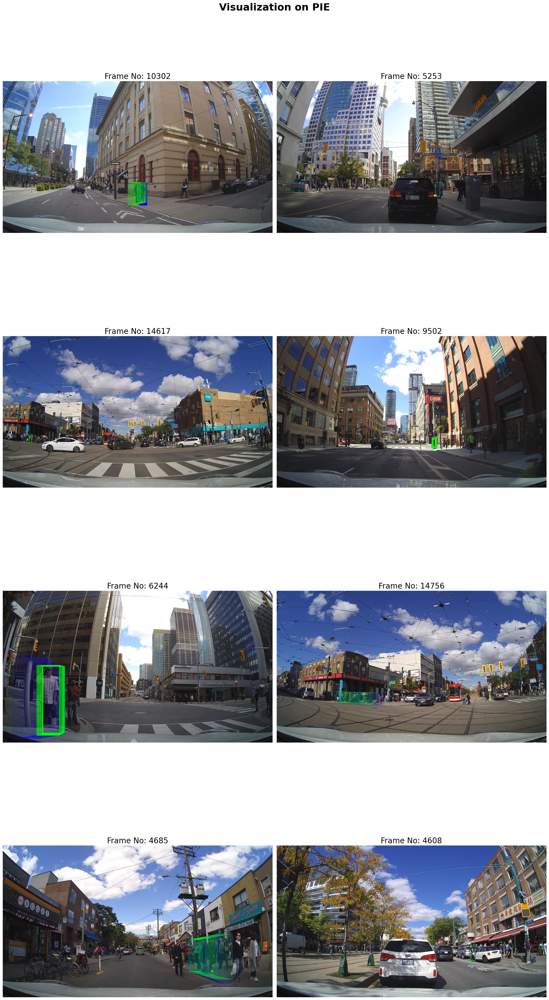

In [26]:
visualize_path(train_loader, 0)

### Predictions on test loader

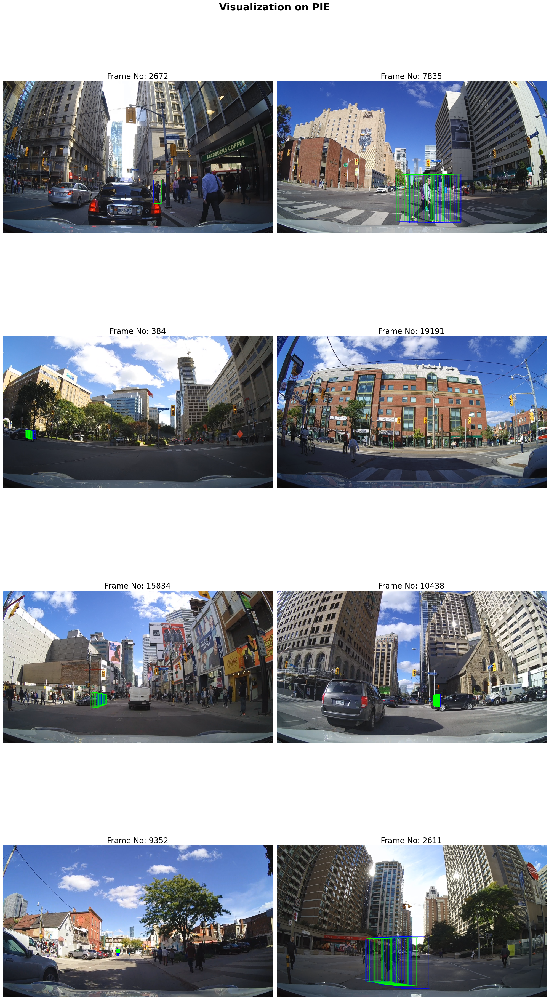

In [25]:
visualize_path(test_loader, 0)